# CASA Summary
The pipeline used for calibration and flagging closely follows that of the CASA pipeline (https://casaguides.nrao.edu/index.php?title=VLA-S-CASA_Pipeline-CASA6.2.1#Stage_7._hifv_checkflag:_Flag_possible_RFI_on_BP_calibrator_using_rflag). This notebook summarises the output of the pipeline (calibration tables, flagging summaries, data plots) and can be used to get an overview of the data and identify bad data that needs to be flagged manually.

In [1]:
import os
import sys
import h5py
import yaml
import casatasks
import numpy as np
from astropy.time import Time
import astropy.units as u
from ipywidgets import interact

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib as mpl

cmap = mpl.cm.viridis  
cmap.set_bad(color='red')

from IPython.display import Image

# read yaml file
with open("../input/config.yaml", "r") as file:
    conf = yaml.safe_load(file)
    
sys.path.append(os.path.join(os.curdir, "../"))

from vlapy import vladata, inspect

## Obervation Information 
The data below is the output of CASA's listobs task and can be used to fill in the yaml file "obs.yaml", which contains all the parameters for the pipeline.

In [2]:
obs = conf["obs list"][6]
root = os.path.join(conf["root"], f"{obs}")
name = obs.split(".")[0]

ms = os.path.join(root, f"{obs}_hanning.ms")
vladata.listobs(ms)

BeginTime
58740.25155092594 

EndTime
58740.37081018517 

IntegrationTime
10303.999998092651 

field_0
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': 0.426245723}, 'm1': {'unit': 'rad', 'value': 0.5787469766000002}, 'refer': 'J2000', 'type': 'direction'}
name :  3C48


field_1
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': 0.12757211140000005}, 'm1': {'unit': 'rad', 'value': 0.6098580211}, 'refer': 'J2000', 'type': 'direction'}
name :  J0029+3456


field_10
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': 0.1448186947}, 'm1': {'unit': 'rad', 'value': -0.0248462163}, 'refer': 'J2000', 'type': 'direction'}
name :  QSO J0033-0125


field_11
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': 0.2401943933}, 'm1': {'unit': 'rad', 'value': 0.030922871}, 'refer': 'J2000', 'type': 'direction'}
name :  QSO J0055+0146


field_12
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': 0.2882469437}, 'm1': {'unit': 'rad', 'value': -0.008800337900000002}, 'ref

### Array Layout

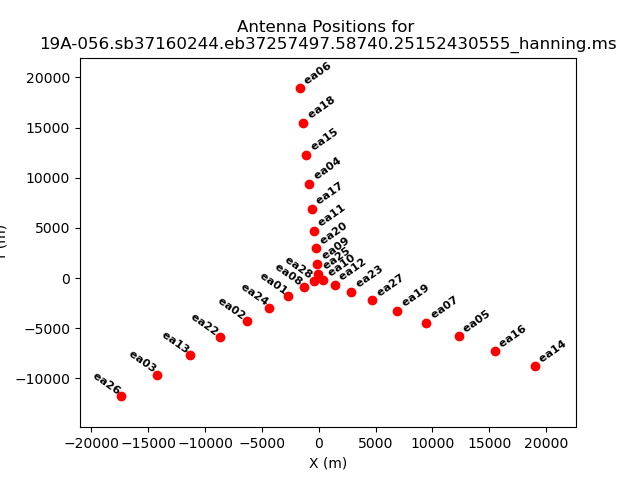

In [3]:
Image(filename=root + "/plots/obsplots/antlayout.png")

### Plot Elevation vs. Time
Observations low in elevation might see more RFI. The plot is colorised by field. Each target field is in between two phase calibrators.

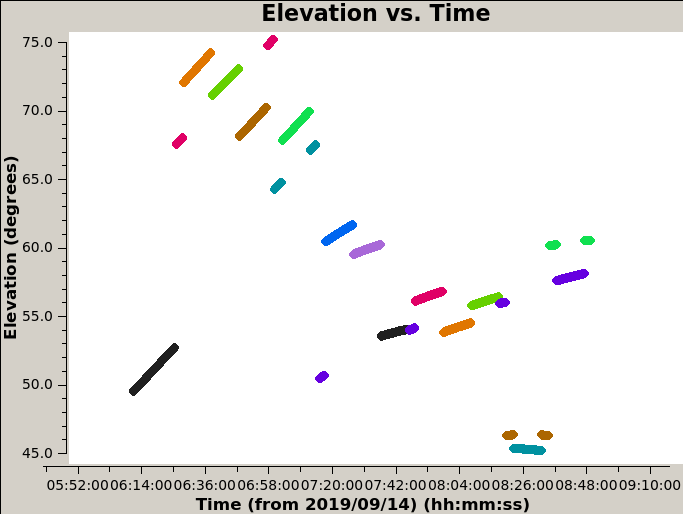

In [4]:
Image(filename=root + "/plots/obsplots/elevation_vs_time.png")

## VLA Deterministic Flags and Manual Flags
These include antennas not on source, shadowed antennas, scans with non-relevant intents, autocorrelations, edge channels of spectral windows, edge channels of the baseband, clipping absolute zero values produced by the correlator and the first few integrations of a scan (quacking). Manual flags are also applied for data known to be bad (RFI, obs reports). Below is a summary of the flags before and after applying the deterministic flags. Use the flagging frequency to find a suitable reference antenna and specify it in the yaml file.

In [5]:
summary_before = np.load(root + "/output/detflag_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + "/output/detflag_summary_after.npy", allow_pickle='TRUE').item()

# print flagging summary
def print_summary(item):
    for subitem in summary_before[item]:
        print(f"{item} {subitem}")
        print(
            "Before: {:.4f}, After: {:.4f}".format(
                100.0 * summary_before[item][subitem]["flagged"] / summary_before[item][subitem]["total"],
                100.0 * summary_after[item][subitem]["flagged"] / summary_after[item][subitem]["total"],
            )
        )
        print("")
        
print("Flag occupancy (percent) before and after deterministic flags:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after deterministic flags:

field 3C48
Before: 6.9102, After: 23.4511

field J0029+3456
Before: 25.3611, After: 32.8346

field J0050-0929
Before: 13.7689, After: 28.1439

field J0059+0006
Before: 25.1152, After: 37.6049

field J0119+3210
Before: 18.5110, After: 32.1134

field J0121+0422
Before: 17.6444, After: 31.3840

field QSO J0009+3252
Before: 4.9761, After: 20.8156

field QSO J0024+3913
Before: 14.7751, After: 23.3078

field QSO J0028+0457
Before: 5.9044, After: 21.5895

field QSO J0033-0125
Before: 13.1738, After: 21.8665

field QSO J0038-1025
Before: 4.4496, After: 20.3821

field QSO J0045+0901
Before: 14.1981, After: 22.7875

field QSO J0050+3445
Before: 6.4436, After: 22.0478

field QSO J0055+0146
Before: 4.1240, After: 20.1091

field QSO J0100+2802
Before: 8.5178, After: 21.7566

field QSO J0106-0030
Before: 4.7340, After: 20.6177

field QSO J0112+0110
Before: 4.3826, After: 20.3233

field QSO J0136+0226
Before: 4.6933, After: 20.5820

scan

### Plot Online Flags
Plot flaggingreason vs. time. This shows which antennas are flagged due to focus errors, subreflector errors and antenna not on source. This plot can help identify suitable reference antennas.

In [6]:
if os.path.exists(root+"/plots/dataplots/flaggingreason_vs_time.png"):
    Image(filename=root+"/plots/dataplots/flaggingreason_vs_time.png")

### Plot Antenna Data Stream
If an antenna has missing data, it should not be used as a reference.

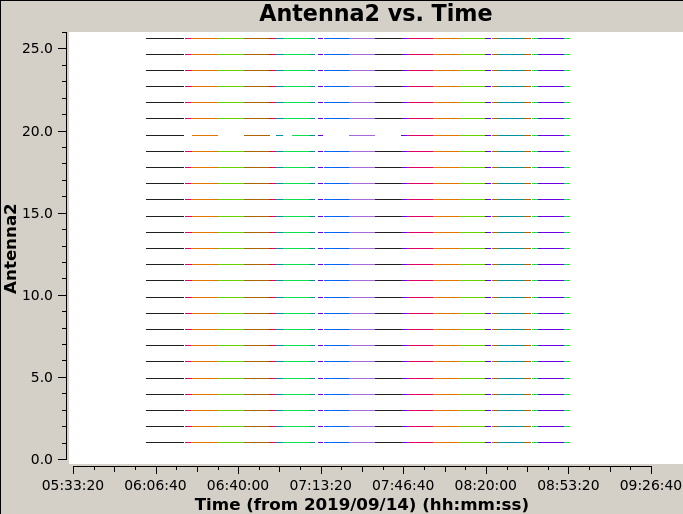

In [7]:
Image(filename=root + "/plots/obsplots/data_stream.png")

## Find Dead Antennas
Antennas that have low power should be flagged. This is also a good time to check for suitable reference antennas.

In [8]:
def plot_dead_ants(ant):
    plotfile = root + f"/plots/dataplots/find_dead_ants_amp_vs_freq_ant_{ant}.png"
    img = mpimg.imread(plotfile)
    plt.imshow(img)
    
interact(plot_dead_ants, ant=(1, 26))
    

interactive(children=(IntSlider(value=13, description='ant', max=26, min=1), Output()), _dom_classes=('widget-…

<function __main__.plot_dead_ants(ant)>

## RFI Inspection
The visibility amplitudes are first averaged across baselines and polarisation products. A modified Z-score is then computed across time as $Z_i = \frac{x_i - \mathrm{med}\{x_i\}_i}{\sigma_\mathrm{MAD}}$, 

where $\sigma_\mathrm{MAD} = \mathrm{med}\{\left|x_i - \mathrm{med}\{x_i\}_i\right|\}$ is the Median Absolute Deviation (MAD), and $x_i$ is the data (visibility amplitude) of the $i^\mathrm{th}$ integration.

The resulting Z-score is a spectrogram with dimensions of time and frequency. It can further be averaged across one of these dimensions to obtain a time series or a spectrum, which are useful for identifying broadband and persistent narrowband RFI respectively.

Use this to identify one clean channel per spectral window which will be used for the initial gain calibration.

#### Load Data

In [9]:

with h5py.File(root + f"/output/z_score_data.h5", "r") as f:
    z_score = f["z-score avg"][()]
    flags = f["flags avg"][()]
    freq_array = f["freq array"][()]
    time_array = f["time array"][()]
    ant_pairs = f["ant pairs"][()]
    dt = f["dt"][()]

# Load time integrations per scan
ntimes_file = os.path.join(root, f"output/ntimes.txt")
ntimes = np.loadtxt(ntimes_file).astype(int)

# time array
tisot = np.unique(Time(time_array, format="jd", scale="utc").isot)

z_score = np.ma.masked_array(z_score, mask=flags)

#### Plot

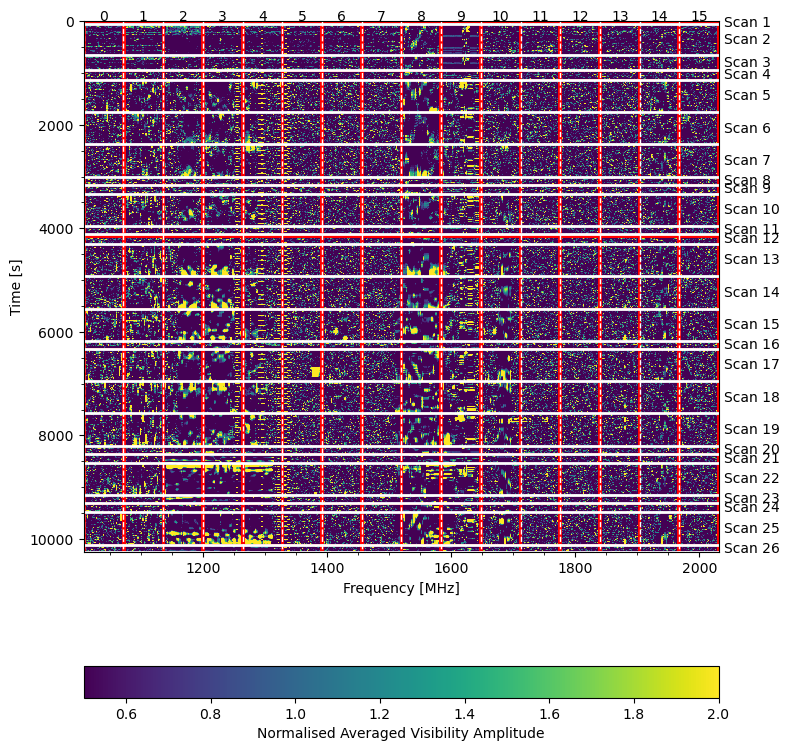

In [10]:
fig, ax = plt.subplots(figsize=(8, 8))
ax, im = inspect.plot_wf(freq_array, z_score, 2, ntimes, vmin=0.5, vmax=2, cmap=cmap, ax=ax, plot_masked=True)
fig.colorbar(im, orientation="horizontal", label="Normalised Averaged Visibility Amplitude")
plt.tight_layout()
plt.show()

In [11]:
def plot_wf_spw(i):
    inspect.plot_wf_spw(freq_array, z_score, i, 2, ntimes, plot_masked=True)
    
interact(plot_wf_spw, i=(0, 15))

interactive(children=(IntSlider(value=7, description='i', max=15), Output()), _dom_classes=('widget-interact',…

<function __main__.plot_wf_spw(i)>

In [12]:
summary_before = np.load(root + "/output/manual_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + "/output/manual_flags_summary_after.npy", allow_pickle='TRUE').item()
        
print("Flag occupancy (percent) before and after manual flags:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after manual flags:

field 3C48
Before: 60.1713, After: 60.1713

field J0029+3456
Before: 65.9854, After: 65.9854

field J0050-0929
Before: 62.8695, After: 62.8695

field J0059+0006
Before: 68.2573, After: 68.2573

field J0119+3210
Before: 65.7257, After: 65.7257

field J0121+0422
Before: 64.7221, After: 64.7221

field QSO J0009+3252
Before: 58.8934, After: 58.8934

field QSO J0024+3913
Before: 60.3808, After: 60.3808

field QSO J0028+0457
Before: 59.1639, After: 59.1639

field QSO J0033-0125
Before: 59.4343, After: 59.4343

field QSO J0038-1025
Before: 58.4878, After: 58.4878

field QSO J0045+0901
Before: 59.8400, After: 59.8400

field QSO J0050+3445
Before: 59.5695, After: 59.5695

field QSO J0055+0146
Before: 58.0821, After: 58.0821

field QSO J0100+2802
Before: 59.4343, After: 59.4343

field QSO J0106-0030
Before: 58.6230, After: 58.6230

field QSO J0112+0110
Before: 58.4852, After: 58.4852

field QSO J0136+0226
Before: 58.6230, After: 58.6230

s

## Flux Calibrator Model
Print model flux densities and plot model amplitude vs. uv-distance. If the calibrator is not resolved, its amplitude should be constant across different uv-distances. If it is slightly resolved, the amplitude will decrease as a function of uv-distance.

In [13]:
setjy = np.load(root + "/output/setjy.npy", allow_pickle='TRUE').item()

print("model flux densities in Jy\n")

for spw in range(16):
    print("SPW {:2d}: I: {:.2f}, U: {:.2f}, V: {:.2f}, Q: {:.2f}".format(spw, *setjy["0"][str(spw)]["fluxd"]))

model flux densities in Jy

SPW  0: I: 21.02, U: 0.00, V: 0.00, Q: 0.00
SPW  1: I: 20.06, U: 0.00, V: 0.00, Q: 0.00
SPW  2: I: 19.18, U: 0.00, V: 0.00, Q: 0.00
SPW  3: I: 18.38, U: 0.00, V: 0.00, Q: 0.00
SPW  4: I: 17.64, U: 0.00, V: 0.00, Q: 0.00
SPW  5: I: 16.96, U: 0.00, V: 0.00, Q: 0.00
SPW  6: I: 16.33, U: 0.00, V: 0.00, Q: 0.00
SPW  7: I: 15.75, U: 0.00, V: 0.00, Q: 0.00
SPW  8: I: 15.20, U: 0.00, V: 0.00, Q: 0.00
SPW  9: I: 14.70, U: 0.00, V: 0.00, Q: 0.00
SPW 10: I: 14.22, U: 0.00, V: 0.00, Q: 0.00
SPW 11: I: 13.78, U: 0.00, V: 0.00, Q: 0.00
SPW 12: I: 13.36, U: 0.00, V: 0.00, Q: 0.00
SPW 13: I: 12.97, U: 0.00, V: 0.00, Q: 0.00
SPW 14: I: 12.59, U: 0.00, V: 0.00, Q: 0.00
SPW 15: I: 12.24, U: 0.00, V: 0.00, Q: 0.00


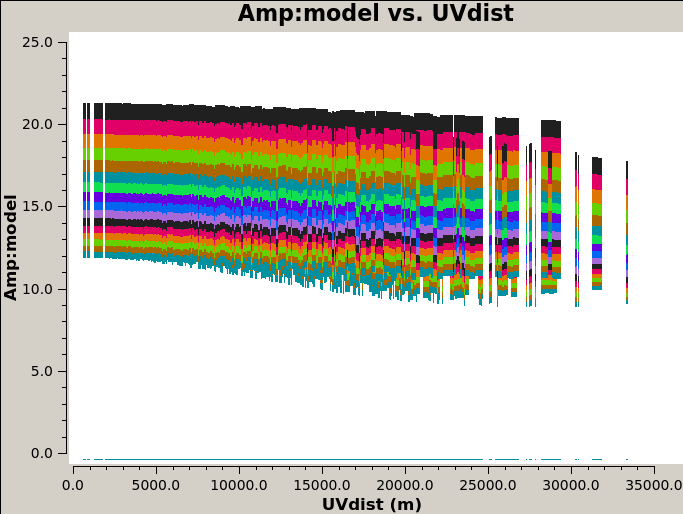

In [14]:
Image(filename=root + "/plots/calplots/setjy_model_amp_vs_uvdist.png")

## Prior Calibration

The prior calibration includes atmospheric opacity corrections, antenna offset corrections and requantizer (rq) gains. These are independent of calibrator observations and use external data instead.

### Weather
Plot weather data and print opacities. For frequencies below 10 GHz the opacity is negligibly small.  

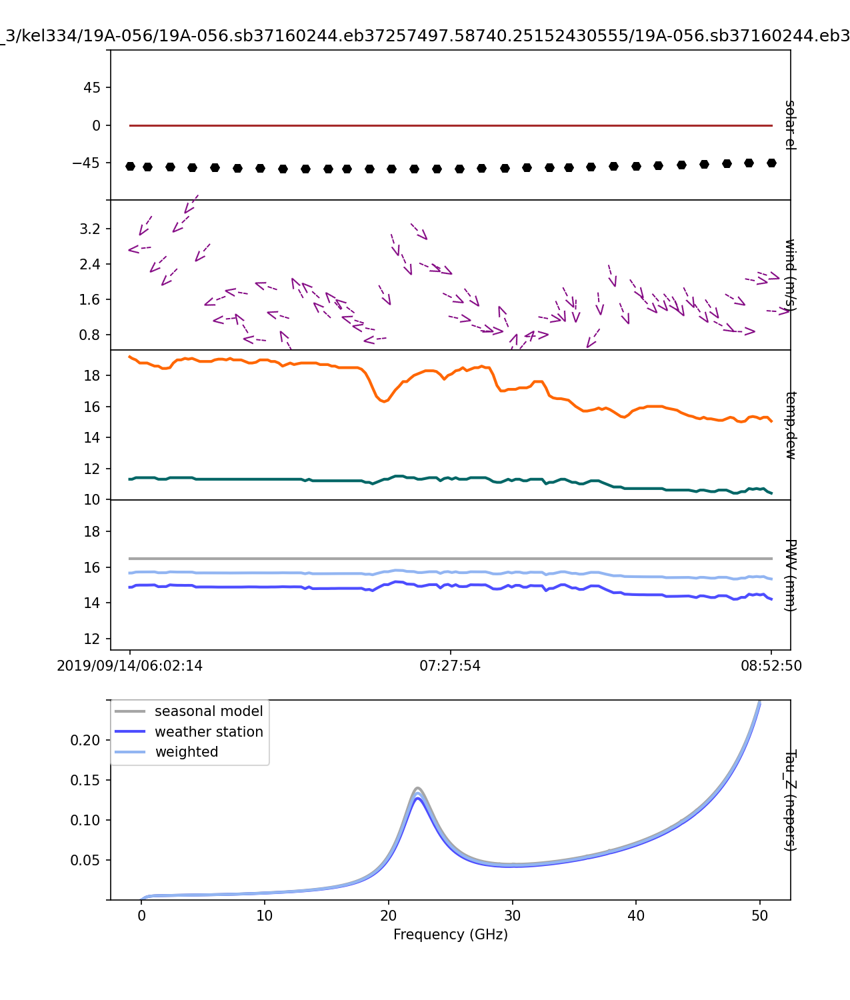

In [15]:
Image(filename=root + "/plots/calplots/weather.png")

In [16]:
opacities = np.load(root + "/output/weather.npy")

print("Opacities [Nepers]\n")

for spw, opacity in enumerate(opacities):
    print(f"SPW {spw}: {opacity}")

Opacities [Nepers]

SPW 0: 0.0051557615629830526
SPW 1: 0.005215982014612631
SPW 2: 0.005268429756012976
SPW 3: 0.005314329726942597
SPW 4: 0.00535511952060478
SPW 5: 0.00539139643344917
SPW 6: 0.0054240916058488475
SPW 7: 0.005453679667822235
SPW 8: 0.005480690050436542
SPW 9: 0.005505529615336893
SPW 10: 0.005528488826372356
SPW 11: 0.005549914519963375
SPW 12: 0.00556995562228749
SPW 13: 0.00558889141125636
SPW 14: 0.005606832801458002
SPW 15: 0.005623958226940581


## Plot Calibration Channels
These are the channels that have been selected for the gain calibration. They should be clean and should not exhibit any amplitude jumps.

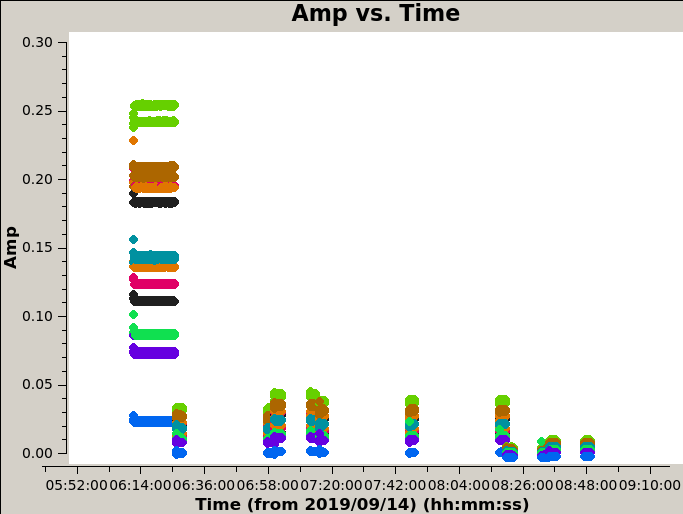

In [17]:
Image(filename=root + "/plots/dataplots/single_chans_amp_vs_time.png")

## Initial Calibration
The initial calibration is done to enable subsequent flagging with automated flagging routines such as CASA's RFlag. The calibration consists of an initial gain phase calibration, a delay calibration, an initial gain phase and amplitude calibration and a bandpass calibration. The two gain calibrations are used for the delay and bandpass calibrations, but are not applied to the data. The gain calibrations are done with a single channel per spectral window.

In [18]:
def plot_two_cols(im1, im2):
    """ 
    Plot two image side by side. E.g phase and amplitude.
    """
    fix, ax = plt.subplots(1, 2, figsize=(15, 5))

    if os.path.exists(im1):
        img_1 = mpimg.imread(im1)
        ax[0].imshow(img_1)

    if os.path.exists(im2):
        img_2 = mpimg.imread(im2)
        ax[1].imshow(img_2)

### Specify Gain Tables

In [19]:
# specify calibration table names
rnd = 0
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

### Delay Initial Gain Calibration
This is an initial per-integration phase calibration and is done to avoid decorrelation under temporal averaging in the subsequent delay calibration. The gain phase should be stable in time. Antennas or spectral windows that have gain phase discontinuities should be flagged. If all but the reference antenna exhibit phase jumps, a difference reference antenna should be chosen.

In [20]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration
The delay calibration is done by fitting for the phase slopes across frequency with respect to the reference antenna. The first and last 15 channels of the spectral windows are not used in this step, since they have lower gains. The delays should lie between -5 and 5 ns, and anything outside that range should be treated with suspicion.

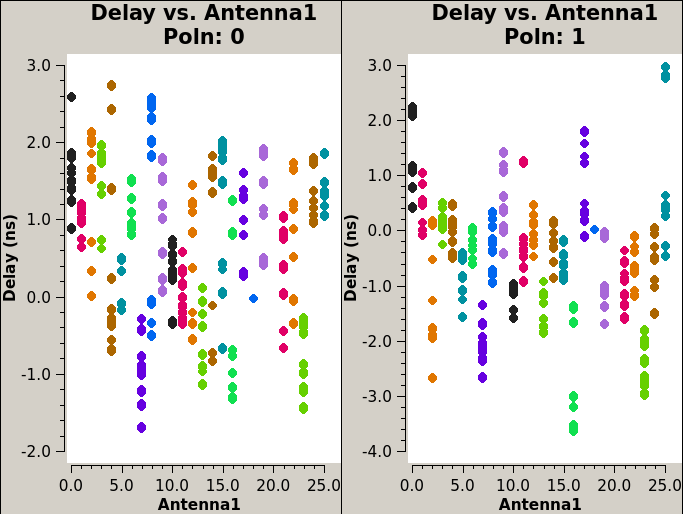

In [21]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration
Similarly to above, we perform an initial gain calibration for the bandpass calibration, but this time we also solve for the amplitudes. The phases and amplitudes should be constant with time and discontinuous solutions should be flagged.

In [22]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration
The amplitudes and phases of the bandpass calibration should be close to 1 and zero respectively after the initial gain calibration. Discontinuities should be flagged.

In [23]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [24]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Plot Corrected Data
This data is averaged in time and colorised by antenna.

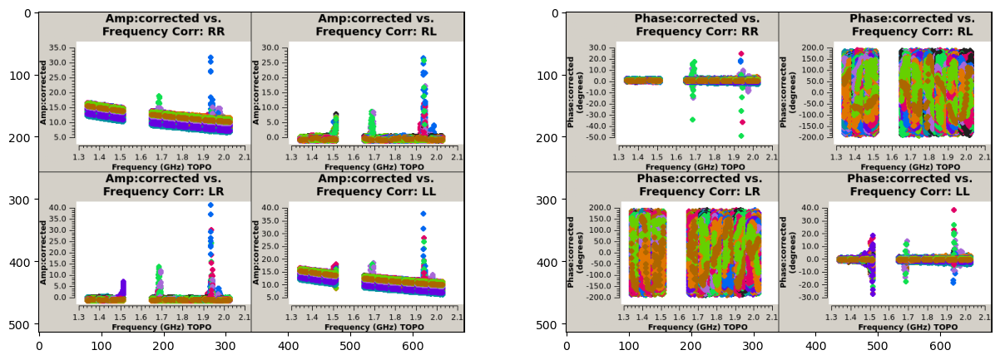

In [25]:
plot_two_cols(
    root + f"/plots/dataplots/fluxcal_initcal_round_0_amp_vs_freq_CorrRR,RL,LR,LL.png",
    root + f"/plots/dataplots/fluxcal_initcal_round_0_phase_vs_freq_CorrRR,RL,LR,LL.png"
)

#### Plot Averaged Corrected Data
Iterate through spectral windows to identify RFI and flag bad channels manually below.

In [26]:
def plot_corrected_spw(spw):
    img = mpimg.imread(root + f"/plots/dataplots/fluxcal_initcal_round_0_amp_vs_freq_avg_spw_{spw}_CorrRR,RL,LR,LL.png")
    plt.imshow(img)

interact(plot_corrected_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_corrected_spw(spw)>

### Flagging Summary
If no calibration solutions are available, data may be flagged (e.g. bad spectral windows).

In [27]:
rnd=0
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after initial calibration round {rnd}:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after initial calibration round 0:

field 3C48
Before: 24.0727, After: 60.1713

antenna ea01
Before: 20.0508, After: 56.7718

antenna ea02
Before: 20.0811, After: 56.7718

antenna ea03
Before: 20.0525, After: 56.7718

antenna ea04
Before: 20.0536, After: 56.7718

antenna ea05
Before: 20.0508, After: 56.7718

antenna ea06
Before: 20.0811, After: 56.7718

antenna ea07
Before: 20.0525, After: 56.7718

antenna ea08
Before: 20.0536, After: 56.7718

antenna ea09
Before: 20.0508, After: 56.7718

antenna ea10
Before: 20.0811, After: 56.7718

antenna ea11
Before: 20.0525, After: 56.7718

antenna ea12
Before: 20.0536, After: 56.7718

antenna ea13
Before: 20.0508, After: 56.7718

antenna ea14
Before: 20.0811, After: 56.7718

antenna ea15
Before: 20.0525, After: 56.7718

antenna ea16
Before: 24.7687, After: 61.4870

antenna ea17
Before: 20.0508, After: 56.7718

antenna ea18
Before: 20.3886, After: 57.0793

antenna ea19
Before: 20.0525, After: 56.7718

antenna ea

## First Round of Flagging on Primary Calibrator
The first round of flagging is performed on the primary calibrator only. The flagging routine runs RFlag with timedevscale=5.0, freqdevscale=5.0 and freqfit=line on a ABS_RL, ABS_LR, ABS_LL, ABS_RR, REAL_LL, REAL_RR, IMAG_LL and IMAG_RR, where for the real and imaginary parts RFLag is performed on the residual (corrected-model) data. TFCrop is run with timecutoff=4.0 and freqcutoff=4.0 on ABS_RL, ABS_LR, ABS_LL and ABS_RR. Flags are extended across polarisations. The plots below show the amplitudes and phases of the calibrators before and after flagging respectively.

### Before Flagging

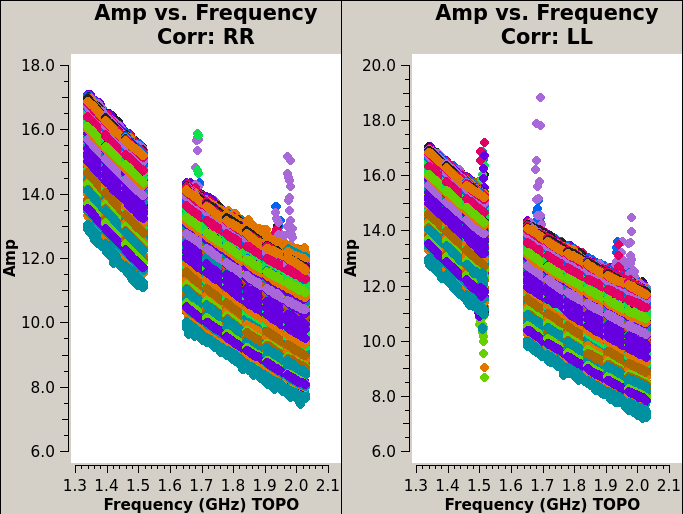

In [28]:
Image(filename=root + "/plots/dataplots/before_fluxcal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

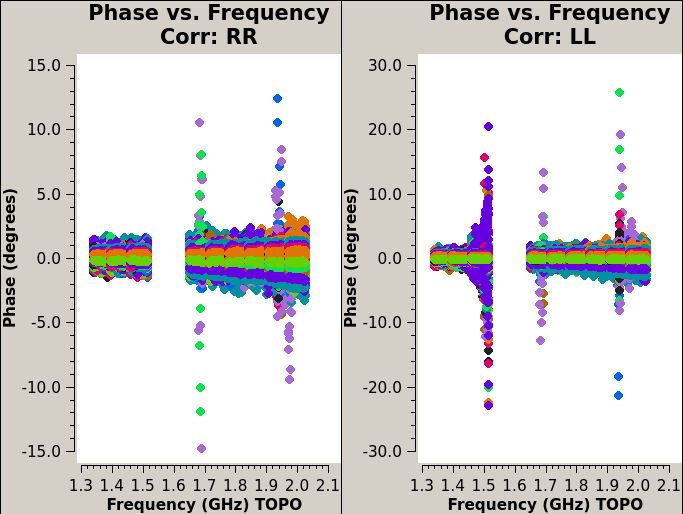

In [29]:
Image(filename=root + "/plots/dataplots/before_fluxcal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### After Flagging

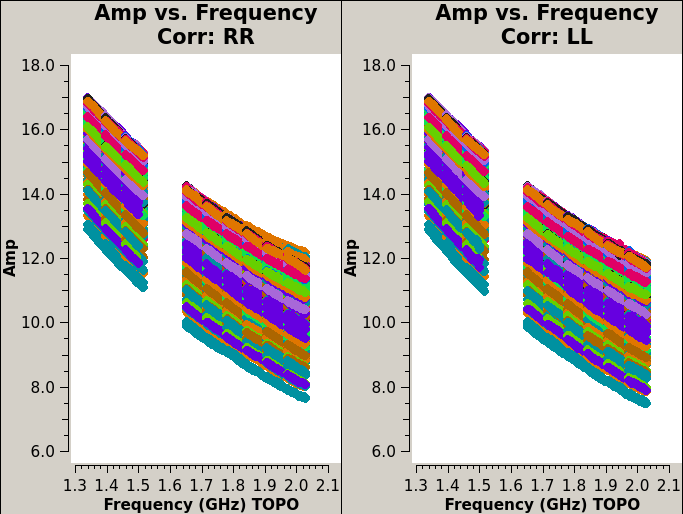

In [30]:
Image(filename=root + "/plots/dataplots/after_fluxcal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

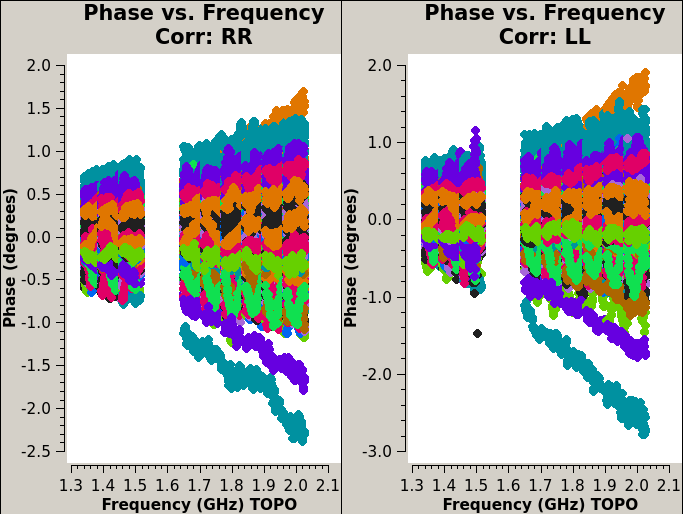

In [31]:
Image(filename=root + "/plots/dataplots/after_fluxcal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### Summary

In [32]:
summary_before = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the flux calibrator:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the flux calibrator:

field 3C48
Before: 60.1713, After: 60.9455

antenna ea01
Before: 56.7718, After: 57.4404

antenna ea02
Before: 56.7718, After: 57.4555

antenna ea03
Before: 56.7718, After: 57.4482

antenna ea04
Before: 56.7718, After: 57.4649

antenna ea05
Before: 56.7718, After: 57.4527

antenna ea06
Before: 56.7718, After: 57.4868

antenna ea07
Before: 56.7718, After: 57.4510

antenna ea08
Before: 56.7718, After: 57.4682

antenna ea09
Before: 56.7718, After: 57.7446

antenna ea10
Before: 56.7718, After: 57.7048

antenna ea11
Before: 56.7718, After: 57.4759

antenna ea12
Before: 56.7718, After: 57.7186

antenna ea13
Before: 56.7718, After: 57.4636

antenna ea14
Before: 56.7718, After: 57.4652

antenna ea15
Before: 56.7718, After: 57.4359

antenna ea16
Before: 61.4870, After: 62.1217

antenna ea17
Before: 56.7718, After: 57.5544

antenna ea18
Before: 57.0793, After: 59.7068

antenna ea19
Before: 56.7718, After: 57.5037

antenna e

## Semi-Final Calibration
The steps from the intitial calibration are repeated. 

### Specify Gain Tables

In [33]:
# specify calibration table names
rnd = 1
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

### Delay Initial Gain Calibration

In [34]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration

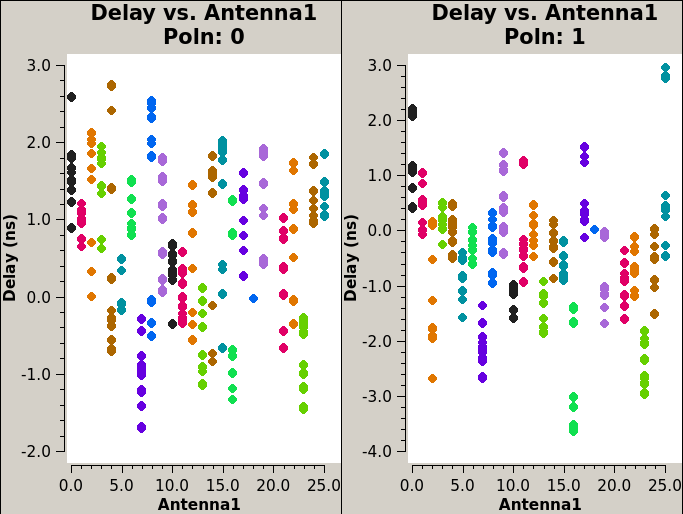

In [35]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration

In [36]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration

In [37]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [38]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Flagging Summary
If no calibration solutions are available, data may be flagged (e.g. bad spectral windows).

In [39]:
rnd=1
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after initial calibration round {rnd}:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after initial calibration round 1:

field 3C48
Before: 60.9455, After: 60.9456

antenna ea01
Before: 57.4404, After: 57.4404

antenna ea02
Before: 57.4555, After: 57.4555

antenna ea03
Before: 57.4482, After: 57.4482

antenna ea04
Before: 57.4649, After: 57.4649

antenna ea05
Before: 57.4527, After: 57.4527

antenna ea06
Before: 57.4868, After: 57.4868

antenna ea07
Before: 57.4510, After: 57.4510

antenna ea08
Before: 57.4682, After: 57.4682

antenna ea09
Before: 57.7446, After: 57.7446

antenna ea10
Before: 57.7048, After: 57.7048

antenna ea11
Before: 57.4759, After: 57.4766

antenna ea12
Before: 57.7186, After: 57.7186

antenna ea13
Before: 57.4636, After: 57.4636

antenna ea14
Before: 57.4652, After: 57.4652

antenna ea15
Before: 57.4359, After: 57.4366

antenna ea16
Before: 62.1217, After: 62.1217

antenna ea17
Before: 57.5544, After: 57.5544

antenna ea18
Before: 59.7068, After: 59.7081

antenna ea19
Before: 57.5037, After: 57.5037

antenna ea

## Second Round of Flagging
The flagging is repeated, but this time on all calibrators.

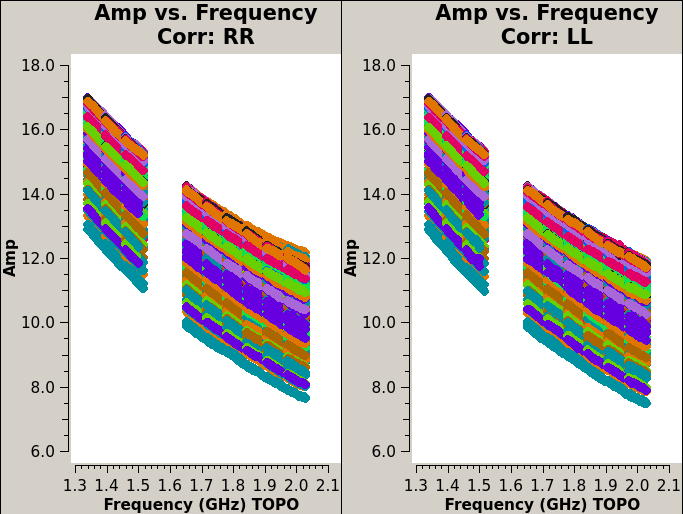

In [40]:
# primary calibrator
Image(filename=root + "/plots/dataplots/before_fluxcal_round_1_flagging_amp_vs_freq_CorrRR,LL.png")

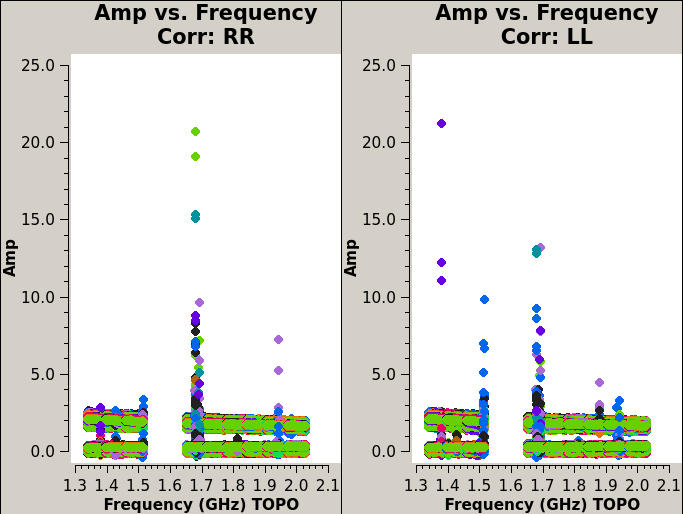

In [41]:
# phase calibrators
Image(filename=root + "/plots/dataplots/before_phasecal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

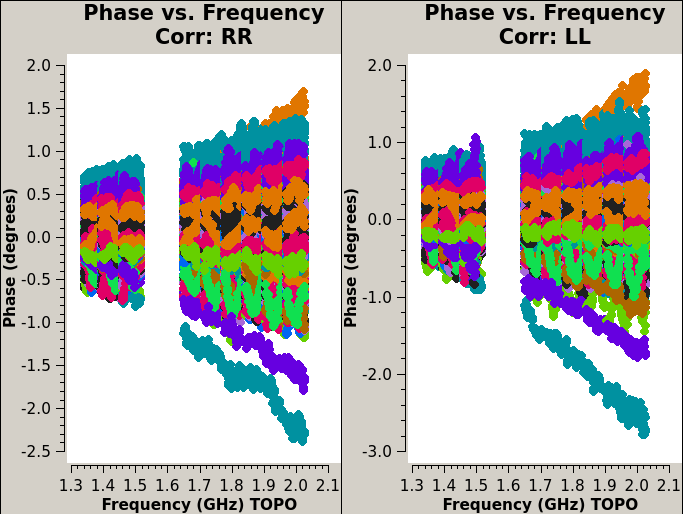

In [42]:
# primary calibrator
Image(filename=root + "/plots/dataplots/before_fluxcal_round_1_flagging_phase_vs_freq_CorrRR,LL.png")

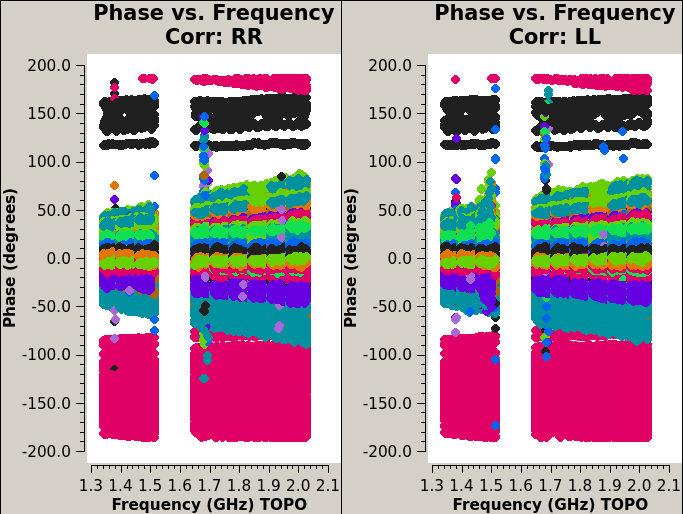

In [43]:
# phase calibrators
Image(filename=root + "/plots/dataplots/before_phasecal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### After Flagging

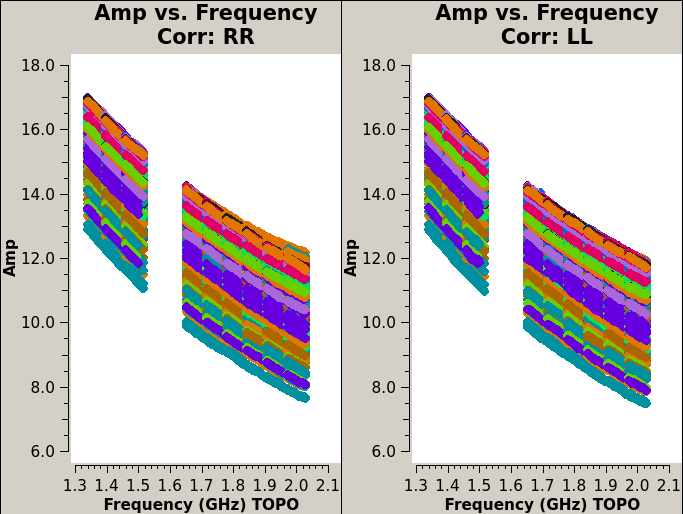

In [44]:
# primary calibrator
Image(filename=root + "/plots/dataplots/after_fluxcal_round_1_flagging_amp_vs_freq_CorrRR,LL.png")

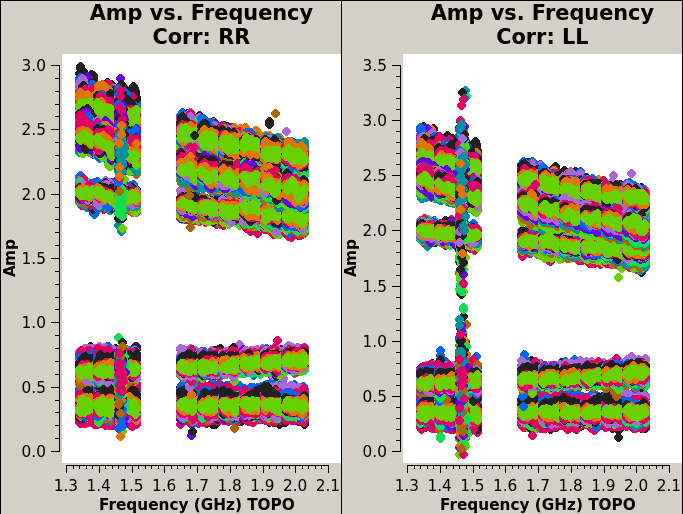

In [45]:
# phase calibrators
Image(filename=root + "/plots/dataplots/after_phasecal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

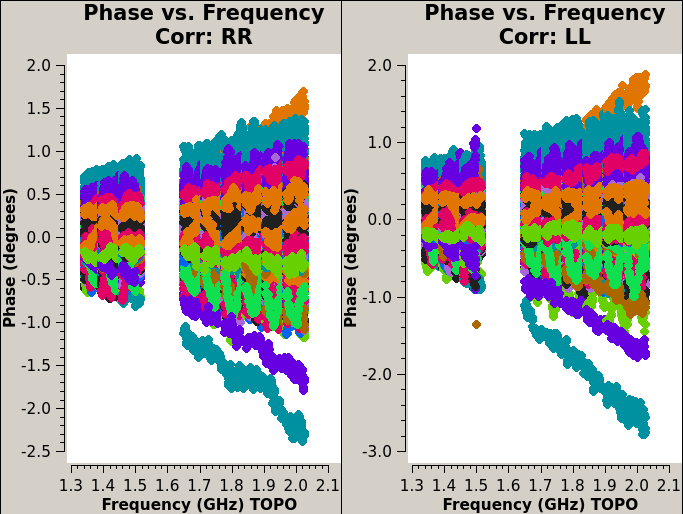

In [46]:
# primary calibrator
Image(filename=root + "/plots/dataplots/after_fluxcal_round_1_flagging_phase_vs_freq_CorrRR,LL.png")

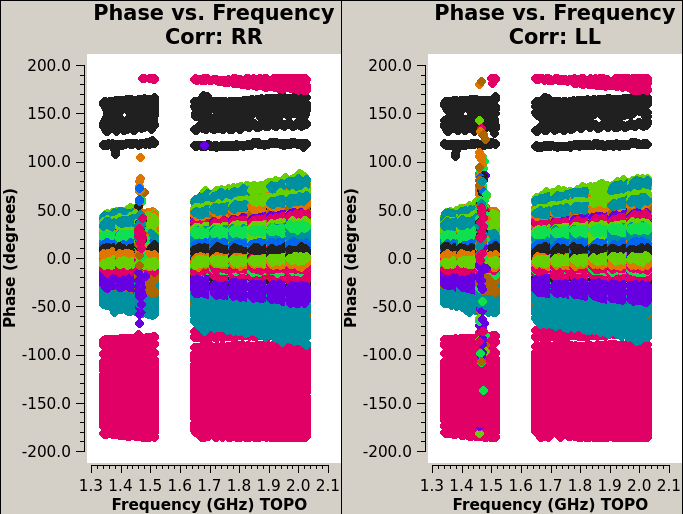

In [47]:
# phase calibrators
Image(filename=root + "/plots/dataplots/after_phasecal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### Flagging Summary

In [48]:
summary_before = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the flux calibrator:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the flux calibrator:

field 3C48
Before: 60.9456, After: 61.0476

scan 1
Before: 100.0000, After: 100.0000

scan 2
Before: 58.3592, After: 58.4689

scan 3
Before: 58.7794, After: 58.8850

antenna ea01
Before: 57.4404, After: 57.5085

antenna ea02
Before: 57.4555, After: 57.5128

antenna ea03
Before: 57.4482, After: 57.5260

antenna ea04
Before: 57.4649, After: 57.5691

antenna ea05
Before: 57.4527, After: 57.5240

antenna ea06
Before: 57.4868, After: 57.6265

antenna ea07
Before: 57.4510, After: 57.5501

antenna ea08
Before: 57.4682, After: 57.5498

antenna ea09
Before: 57.7446, After: 57.8613

antenna ea10
Before: 57.7048, After: 57.8446

antenna ea11
Before: 57.4766, After: 57.5693

antenna ea12
Before: 57.7186, After: 57.9547

antenna ea13
Before: 57.4636, After: 57.5576

antenna ea14
Before: 57.4652, After: 57.5245

antenna ea15
Before: 57.4366, After: 57.5176

antenna ea16
Before: 62.1217, After: 62.1988

antenna ea17
Before: 57.5

In [49]:
summary_before = np.load(root + f"/output/phasecal_round_0_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/phasecal_round_0_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the phase calibrators:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the phase calibrators:

field J0029+3456
Before: 66.0605, After: 66.6158

field J0050-0929
Before: 62.9515, After: 64.0833

field J0059+0006
Before: 68.3274, After: 69.3200

field J0119+3210
Before: 65.8014, After: 66.3248

field J0121+0422
Before: 64.8001, After: 65.6876

scan 11
Before: 65.1887, After: 65.7067

scan 12
Before: 76.2456, After: 76.8298

scan 16
Before: 64.0474, After: 65.2133

scan 20
Before: 62.3353, After: 63.6841

scan 21
Before: 64.8874, After: 66.1079

scan 23
Before: 60.6233, After: 61.6482

scan 24
Before: 68.2088, After: 68.9928

scan 26
Before: 60.7004, After: 61.7124

scan 4
Before: 68.2088, After: 68.7227

scan 8
Before: 63.4767, After: 64.0818

scan 9
Before: 66.3108, After: 66.8388

antenna ea01
Before: 62.8770, After: 63.4564

antenna ea02
Before: 62.9260, After: 63.4517

antenna ea03
Before: 62.8770, After: 63.2897

antenna ea04
Before: 62.8770, After: 63.7713

antenna ea05
Before: 62.8770, After: 63.320

## Final Calibration
First, the initial calibration (delay and bandpass) are repeated on the primary calibrator. Then, the final gains of the calibrators are derived.

### Specify Gain Tables

In [50]:
# specify calibration table names
rnd = 2
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

fluxcal_phase_table = f"{name}_fluxcal_phase.Gfinal"
short_gain_table = f"{name}_short.Gfinal"
amp_gain_table = f"{name}_amp.Gfinal"
phase_gain_table = f"{name}_phase.Gfinal"

### Delay Initial Gain Calibration

In [51]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration

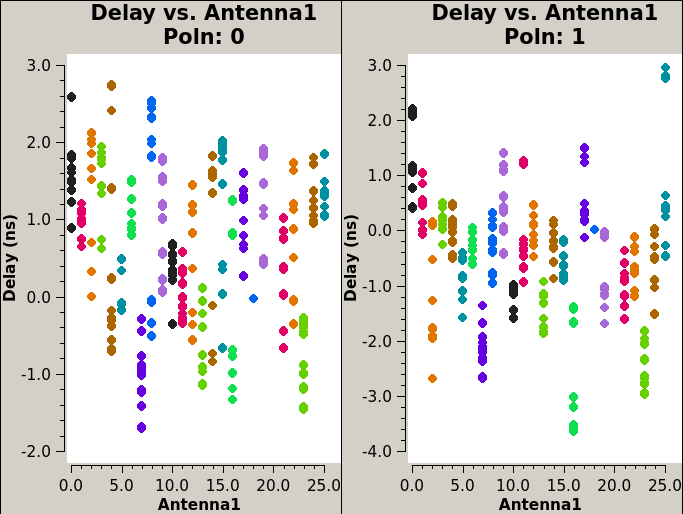

In [52]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration

In [53]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration

In [54]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [55]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Flux Calibrator Final Gain Phase

In [56]:
def plot_final_fluxcal_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{fluxcal_phase_table}_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_fluxcal_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_fluxcal_phase(ant)>

### Short Interval Gain Calibration
This is an initial calibration done on a per-integration basis on the calibrators.

In [57]:
def plot_final_short_gain_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{short_gain_table}_phase_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_short_gain_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_short_gain_phase(ant)>

### Long Interval Gain Calibration
The gain amplitudes of the calibrators of solved for using the initial gain phase calibration above.

In [58]:
def plot_final_long_gain(ant):
    plot_two_cols(
        root + f'/plots/calplots/{amp_gain_table}_amp_ant_{ant}_Poln0,1.png',
        root + f'/plots/calplots/{amp_gain_table}_phase_ant_{ant}_Poln0,1.png'
    )

interact(plot_final_long_gain, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_long_gain(ant)>

### Phase Calibration
Derive the final gain phases of the calibrators. That of the primary calibrator should be close to zero, since it was already derived and applied earlier on.

In [59]:
def plot_final_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{phase_gain_table}_phase_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_phase(ant)>

### Flagging Summary

In [60]:
rnd=1
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after final delay and bandpass calibration:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after final delay and bandpass calibration:

field 3C48
Before: 60.9455, After: 60.9456

antenna ea01
Before: 57.4404, After: 57.4404

antenna ea02
Before: 57.4555, After: 57.4555

antenna ea03
Before: 57.4482, After: 57.4482

antenna ea04
Before: 57.4649, After: 57.4649

antenna ea05
Before: 57.4527, After: 57.4527

antenna ea06
Before: 57.4868, After: 57.4868

antenna ea07
Before: 57.4510, After: 57.4510

antenna ea08
Before: 57.4682, After: 57.4682

antenna ea09
Before: 57.7446, After: 57.7446

antenna ea10
Before: 57.7048, After: 57.7048

antenna ea11
Before: 57.4759, After: 57.4766

antenna ea12
Before: 57.7186, After: 57.7186

antenna ea13
Before: 57.4636, After: 57.4636

antenna ea14
Before: 57.4652, After: 57.4652

antenna ea15
Before: 57.4359, After: 57.4366

antenna ea16
Before: 62.1217, After: 62.1217

antenna ea17
Before: 57.5544, After: 57.5544

antenna ea18
Before: 59.7068, After: 59.7081

antenna ea19
Before: 57.5037, After: 57.5037

a

In [61]:
summary_before = np.load(root + f"/output/applycal_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/applycal_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after applying final calibration:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after applying final calibration:

field 3C48
Before: 61.0476, After: 61.0838

field J0029+3456
Before: 66.6158, After: 66.6159

field J0050-0929
Before: 64.0833, After: 64.0840

field J0059+0006
Before: 69.3200, After: 69.3204

field J0119+3210
Before: 66.3248, After: 66.3258

field J0121+0422
Before: 65.6876, After: 65.6885

field QSO J0009+3252
Before: 58.9907, After: 59.2696

field QSO J0024+3913
Before: 60.4746, After: 60.7434

field QSO J0028+0457
Before: 59.2605, After: 59.5375

field QSO J0033-0125
Before: 59.5303, After: 59.8055

field QSO J0038-1025
Before: 58.5860, After: 58.8676

field QSO J0045+0901
Before: 59.9350, After: 60.2074

field QSO J0050+3445
Before: 59.6652, After: 59.9395

field QSO J0055+0146
Before: 58.1813, After: 58.4657

field QSO J0100+2802
Before: 59.5303, After: 59.8055

field QSO J0106-0030
Before: 58.7209, After: 59.0016

field QSO J0112+0110
Before: 58.5834, After: 58.8651

field QSO J0136+0226
Before: 58.7209, Aft

## Target Flags
Now that the final calibration tables have been derived and applied to the data, the automated flagging routine is run on the target fields.

### Before Flagging

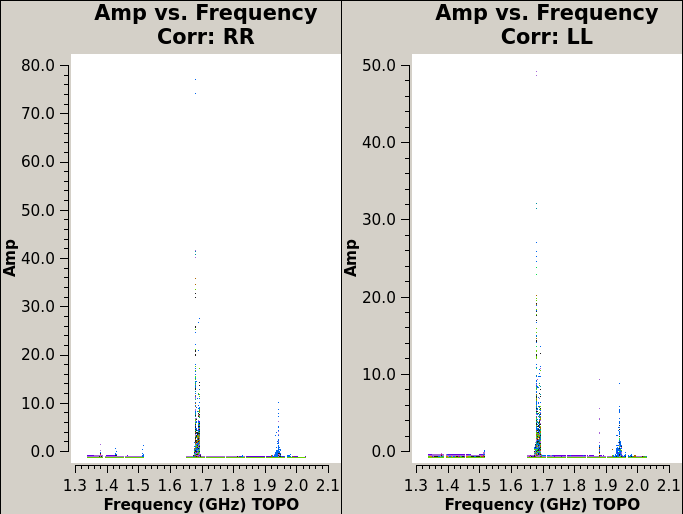

In [62]:
Image(filename=root + "/plots/dataplots/before_targets_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

### After Flagging

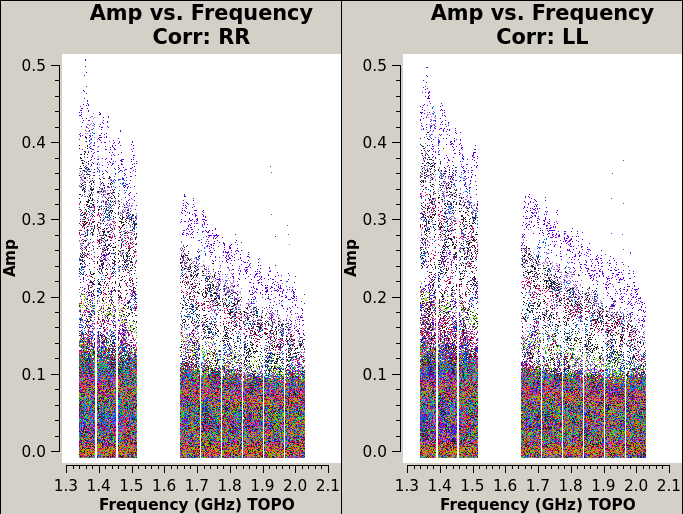

In [63]:
Image(filename=root + "/plots/dataplots/after_targets_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

### Summary

In [64]:
rnd=0
summary_before = np.load(root + f"/output/targets_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/targets_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) after flagging the flux calibrator:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) after flagging the flux calibrator:

field QSO J0009+3252
Before: 59.2696, After: 59.7002

field QSO J0024+3913
Before: 60.7434, After: 61.0441

field QSO J0028+0457
Before: 59.5375, After: 60.2057

field QSO J0033-0125
Before: 59.8055, After: 60.9861

field QSO J0038-1025
Before: 58.8676, After: 59.6001

field QSO J0045+0901
Before: 60.2074, After: 60.6869

field QSO J0050+3445
Before: 59.9395, After: 60.3183

field QSO J0055+0146
Before: 58.4657, After: 59.4417

field QSO J0100+2802
Before: 59.8055, After: 60.2152

field QSO J0106-0030
Before: 59.0016, After: 60.1582

field QSO J0112+0110
Before: 58.8651, After: 59.8672

field QSO J0136+0226
Before: 59.0016, After: 59.8911

scan 10
Before: 59.8055, After: 60.2152

scan 13
Before: 60.2074, After: 60.6869

scan 14
Before: 59.5375, After: 60.2057

scan 15
Before: 59.8055, After: 60.9861

scan 17
Before: 58.4657, After: 59.4417

scan 18
Before: 59.0016, After: 60.1582

scan 19
Before: 58.8651, After: 59.8672

sca

## Summary Plots
These plots show the corrected amplitudes and phases of all fields as a function of uv-distance and frequency. The values plotted against uv-distance are colorised by spectral window while those plotted against frequency are colorised by antenna number. Remaining RFI should be flagged manually in CASA.

In [65]:
field_dict = vladata.get_field_names(ms)
fields = field_dict["calibrators"] + "," + field_dict["targets"]

3C48


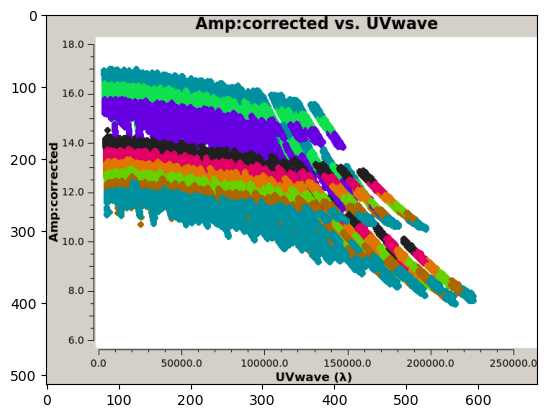

J0029+3456


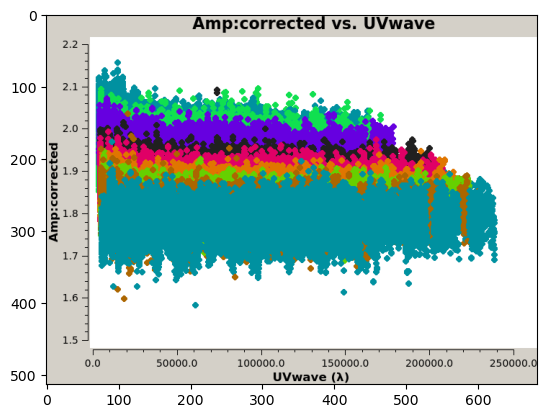

J0119+3210


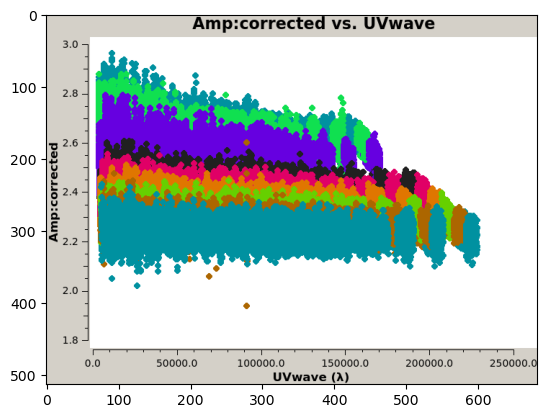

J0059+0006


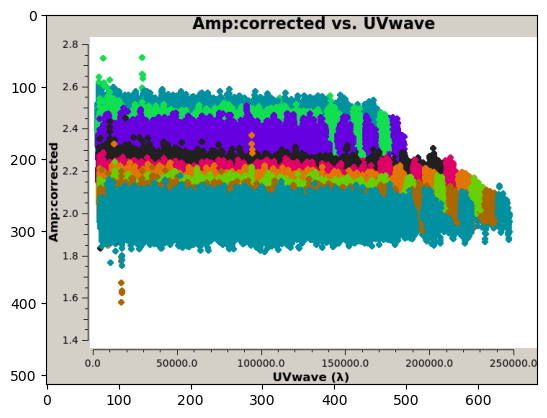

J0050-0929


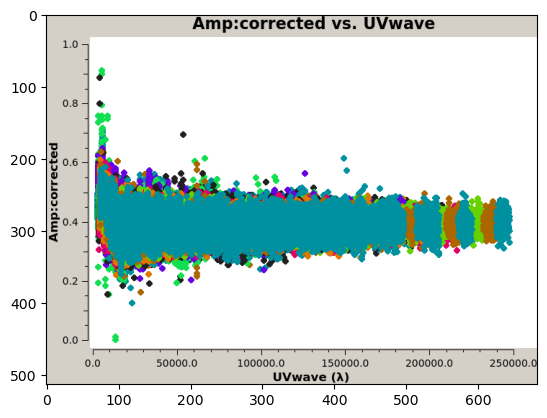

J0121+0422


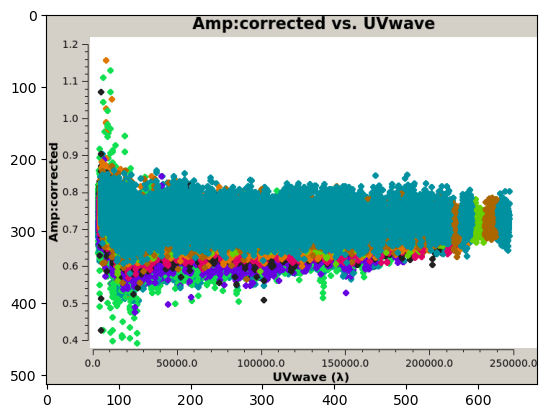

QSO J0009+3252


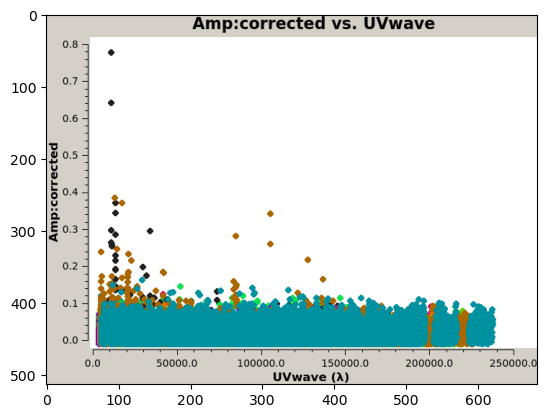

QSO J0024+3913


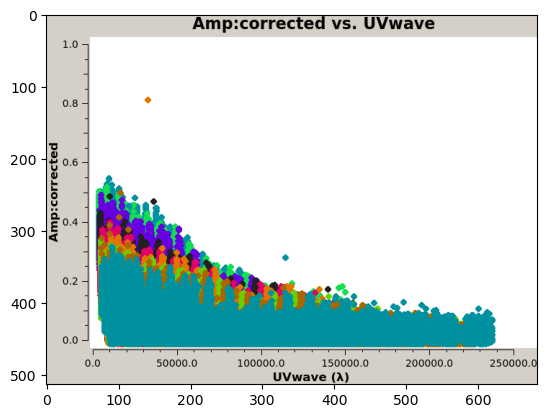

QSO J0050+3445


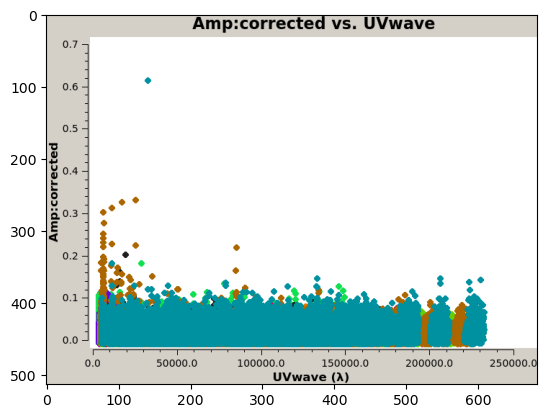

QSO J0100+2802


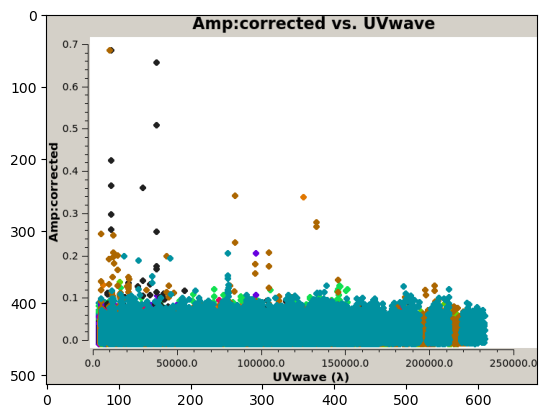

QSO J0045+0901


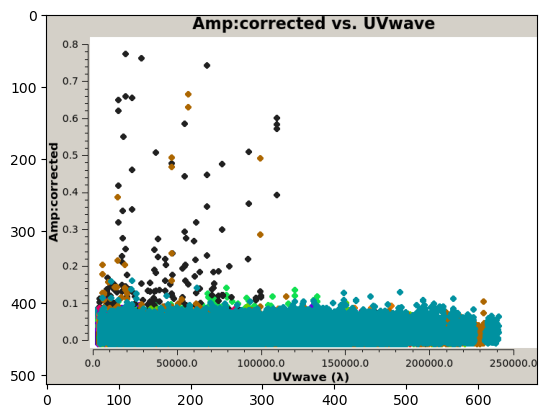

QSO J0028+0457


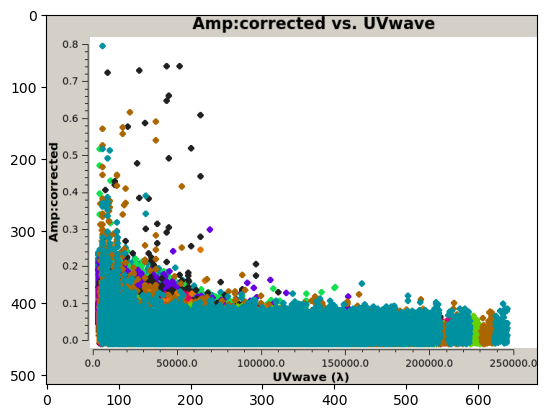

QSO J0033-0125


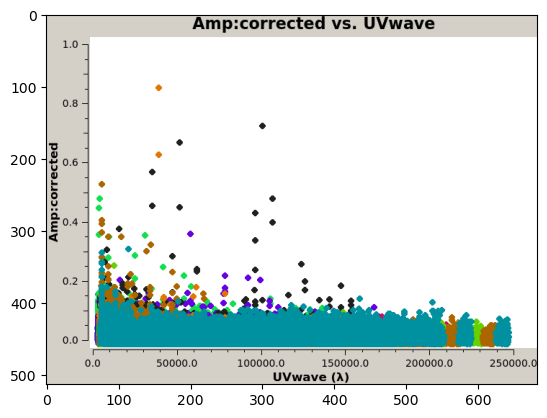

QSO J0055+0146


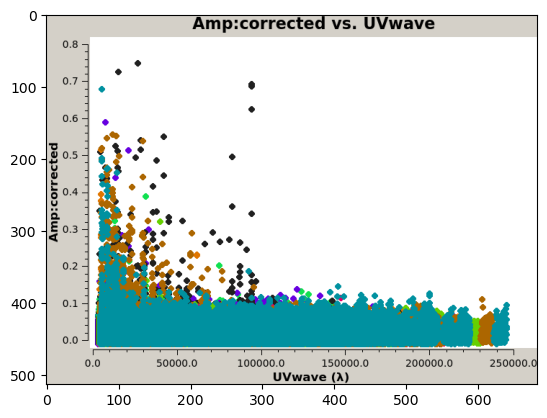

QSO J0106-0030


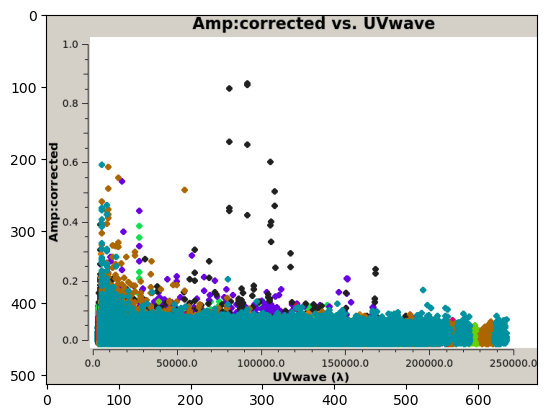

QSO J0112+0110


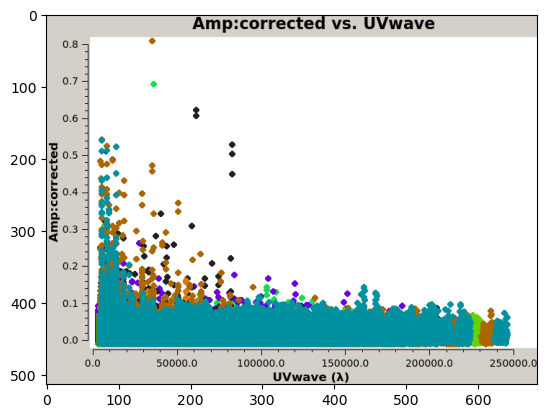

QSO J0038-1025


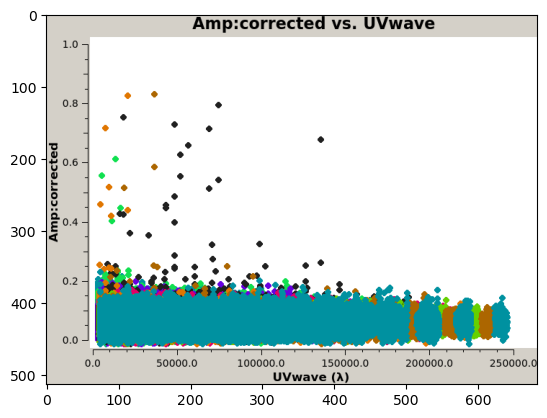

QSO J0136+0226


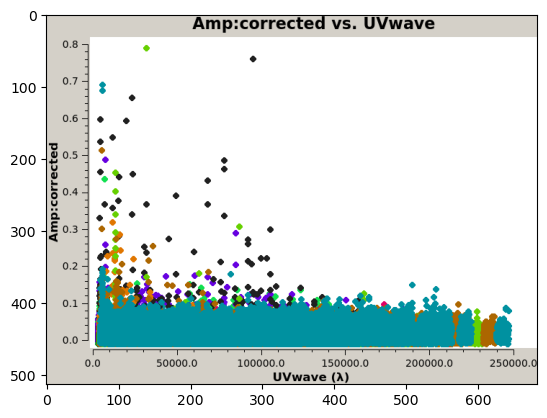

In [66]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_amp_vs_uvdist_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

3C48


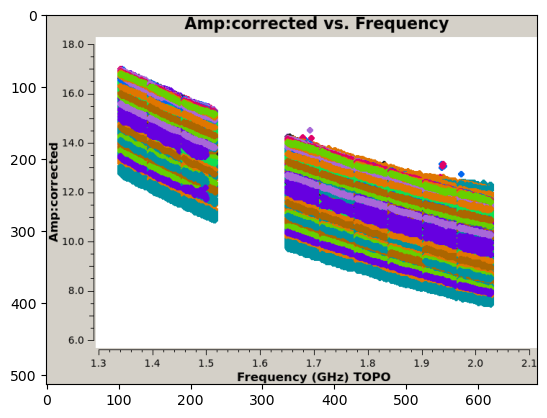

J0029+3456


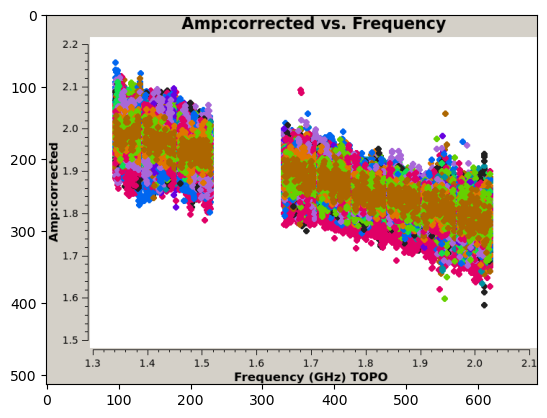

J0119+3210


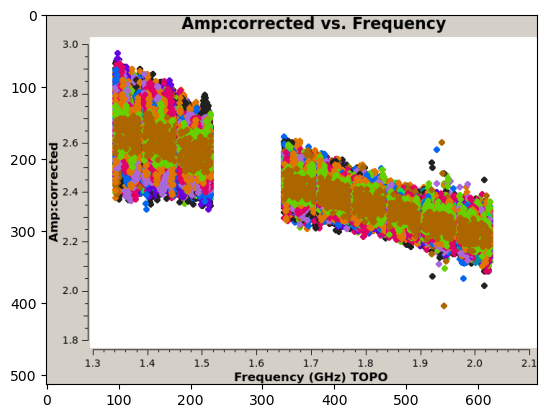

J0059+0006


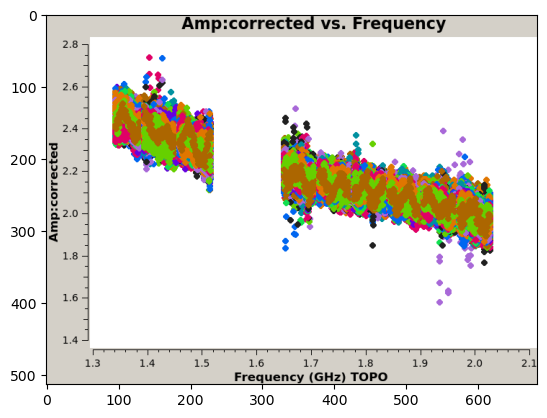

J0050-0929


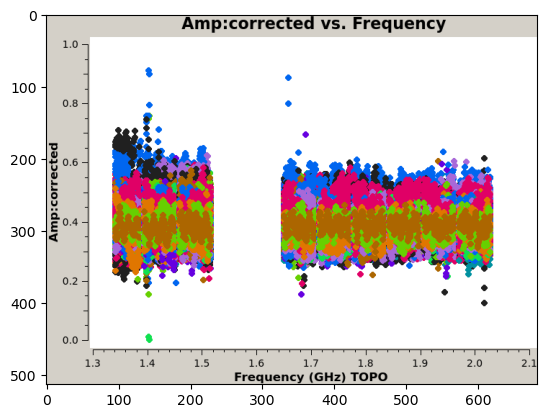

J0121+0422


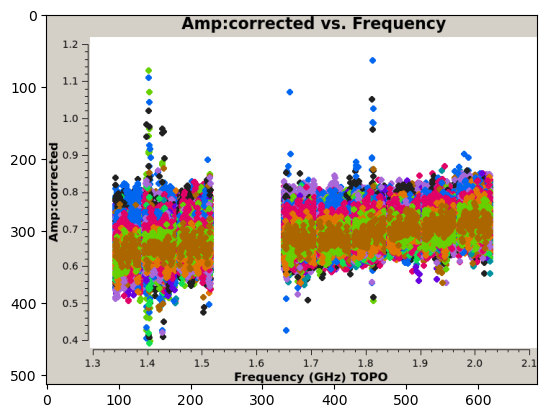

QSO J0009+3252


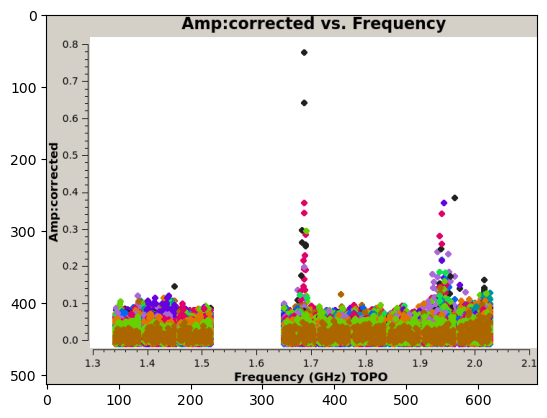

QSO J0024+3913


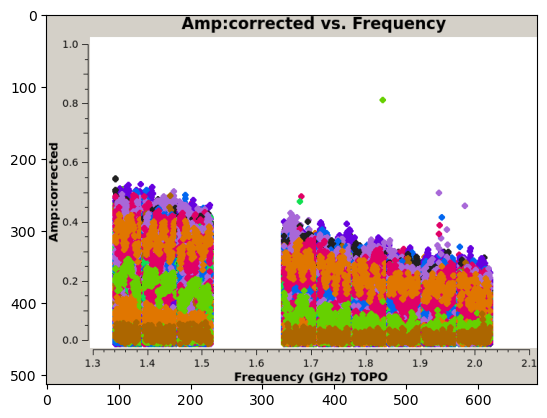

QSO J0050+3445


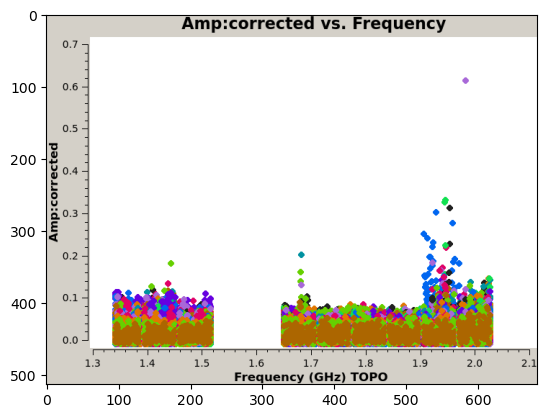

QSO J0100+2802


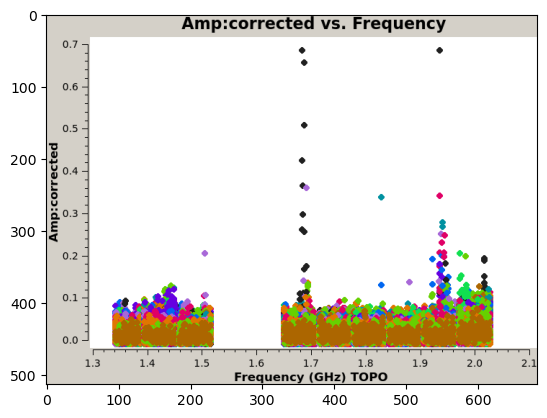

QSO J0045+0901


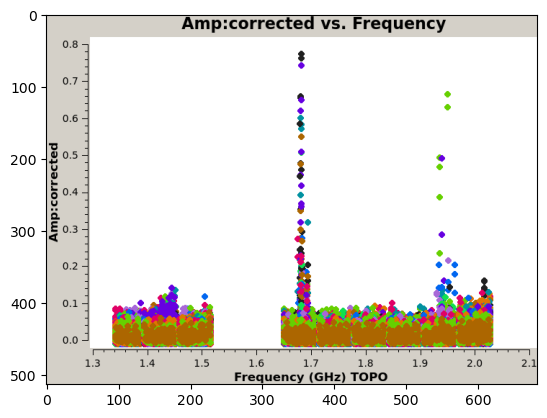

QSO J0028+0457


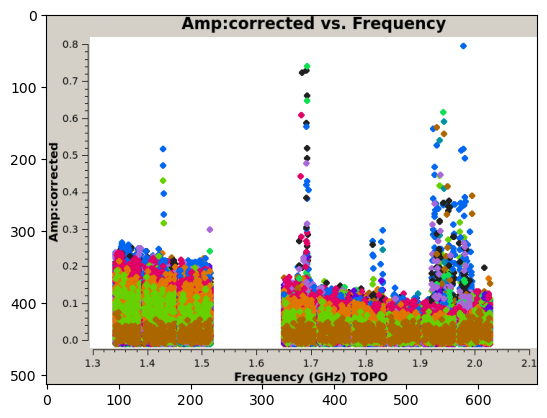

QSO J0033-0125


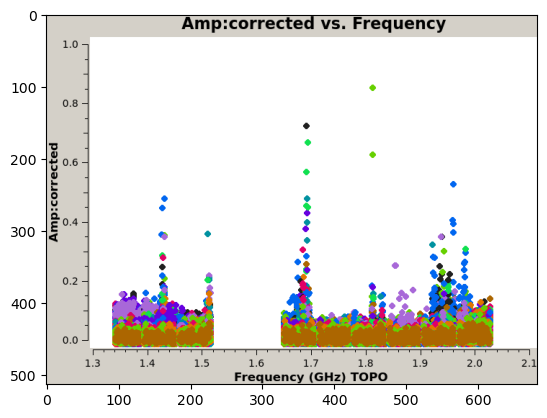

QSO J0055+0146


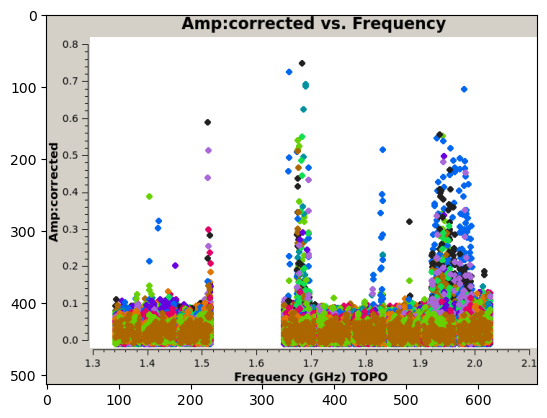

QSO J0106-0030


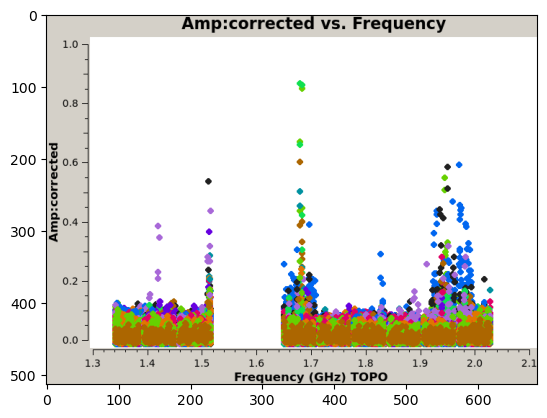

QSO J0112+0110


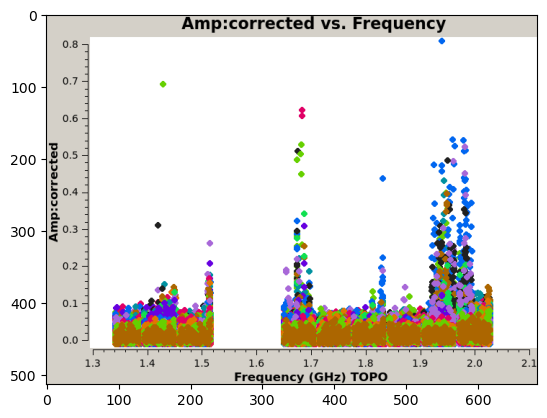

QSO J0038-1025


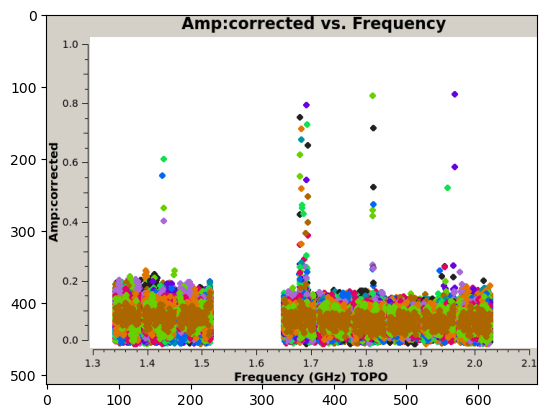

QSO J0136+0226


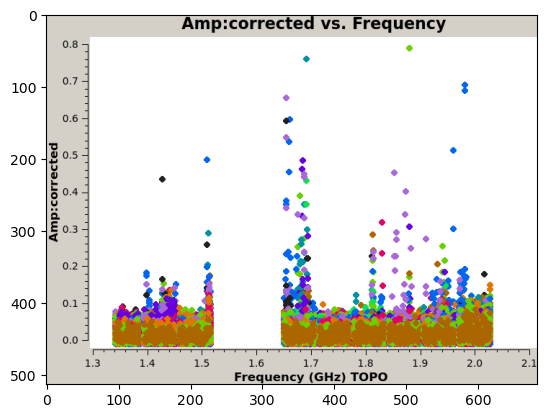

In [67]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_amp_vs_freq_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

3C48


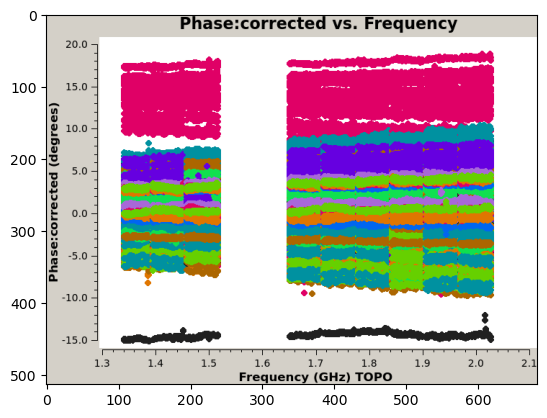

J0029+3456


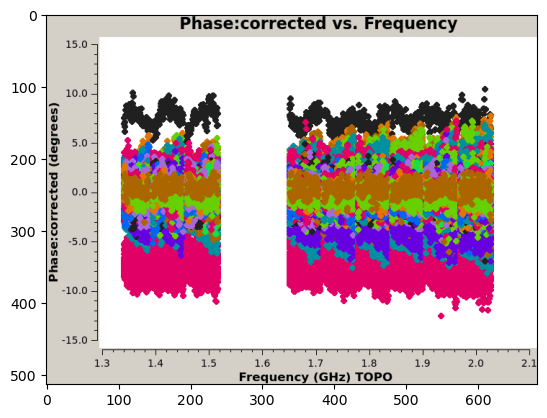

J0119+3210


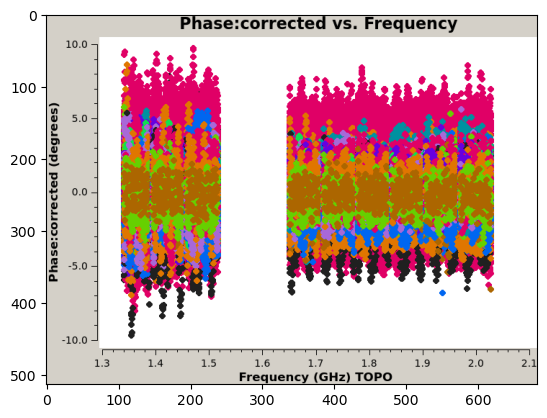

J0059+0006


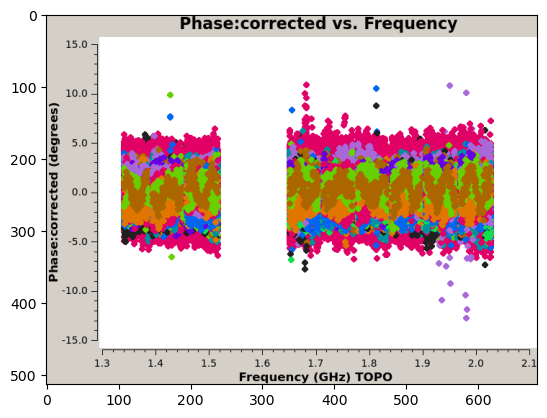

J0050-0929


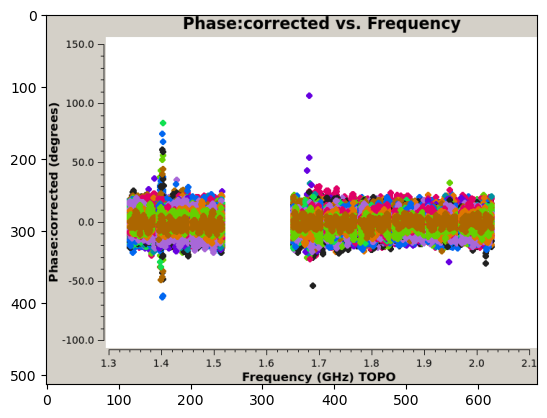

J0121+0422


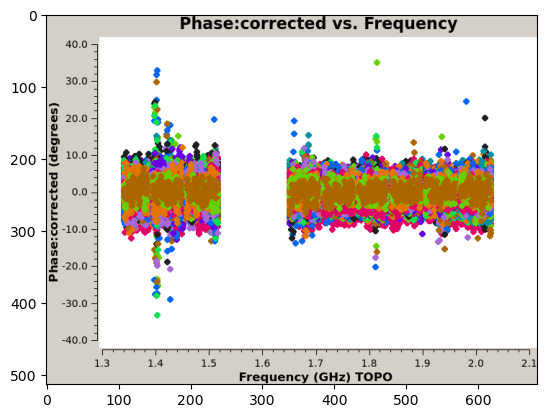

QSO J0009+3252


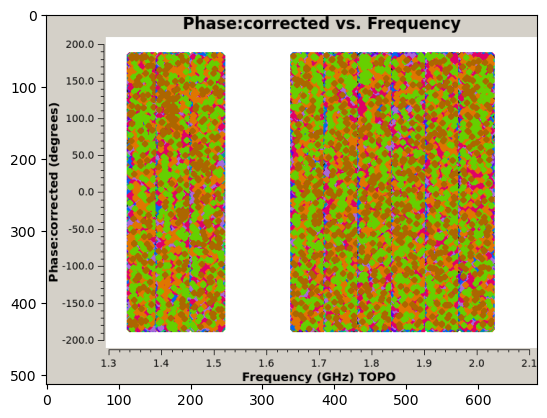

QSO J0024+3913


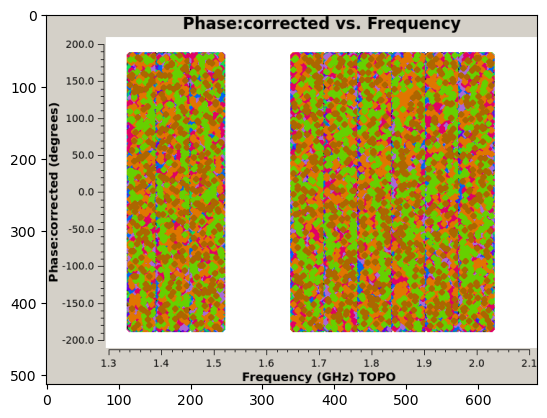

QSO J0050+3445


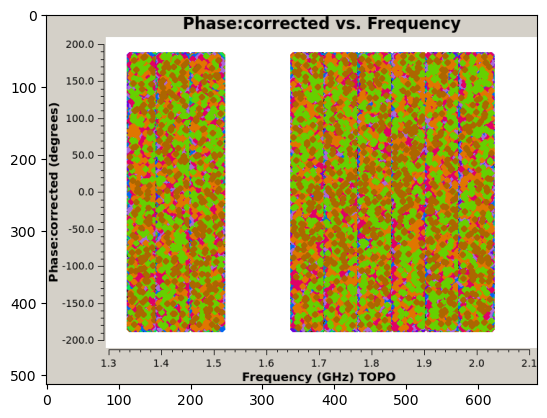

QSO J0100+2802


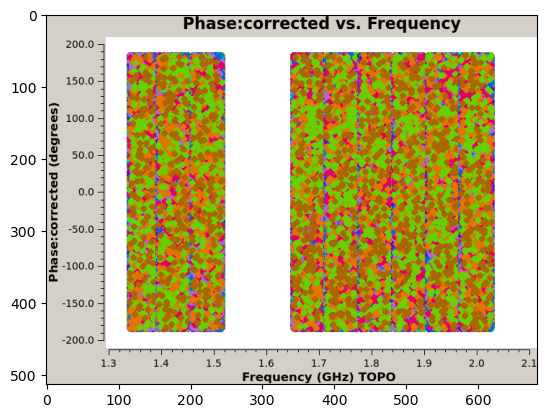

QSO J0045+0901


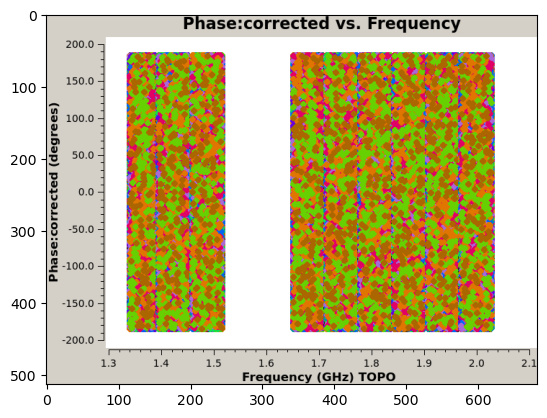

QSO J0028+0457


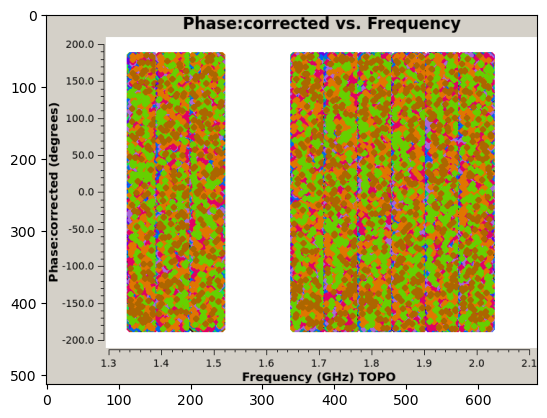

QSO J0033-0125


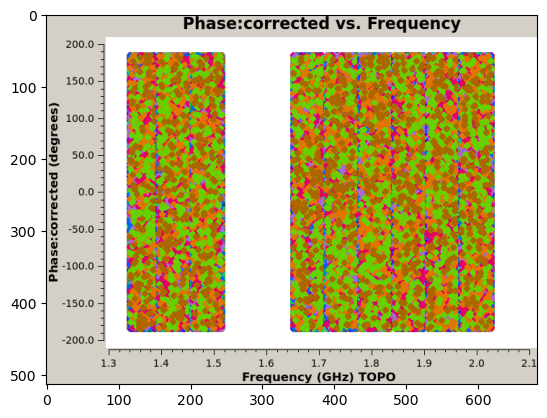

QSO J0055+0146


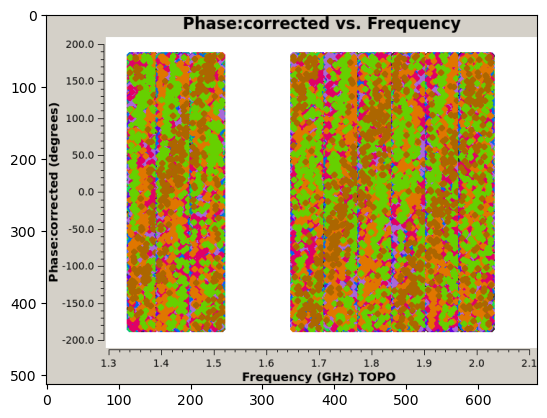

QSO J0106-0030


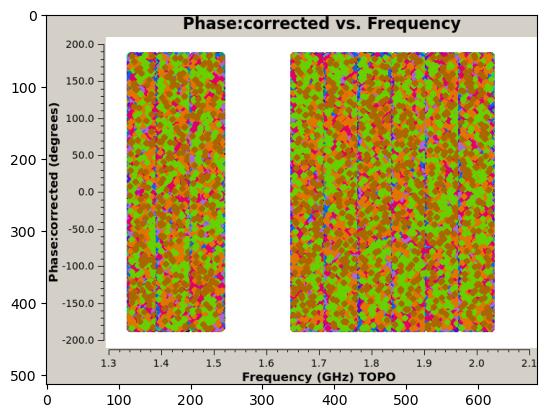

QSO J0112+0110


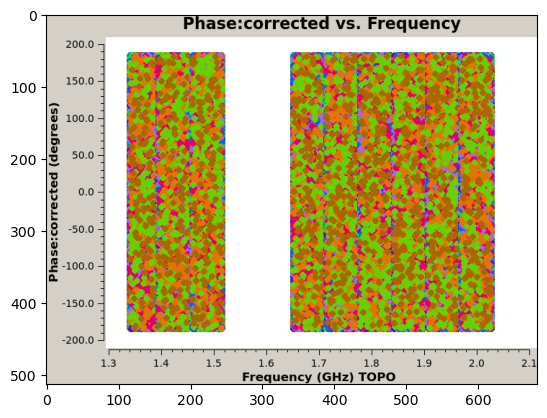

QSO J0038-1025


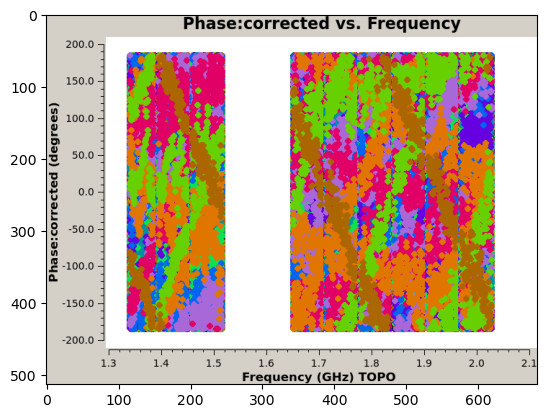

QSO J0136+0226


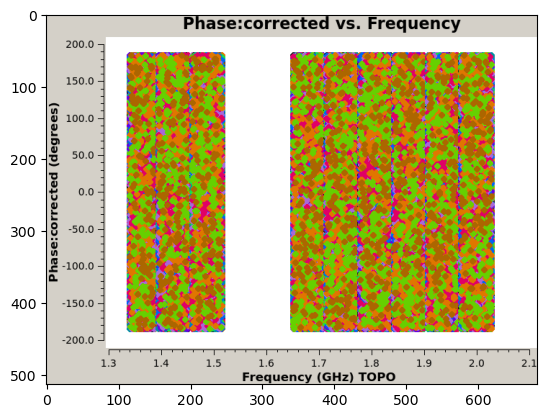

In [68]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_phase_vs_freq_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

In [69]:

with h5py.File(root + f"/output/z_score_corrected.h5", "r") as f:
    z_score = f["z-score avg"][()]
    flags = f["flags avg"][()]
    freq_array = f["freq array"][()]
    time_array = f["time array"][()]
    ant_pairs = f["ant pairs"][()]
    dt = f["dt"][()]

# Load time integrations per scan
ntimes_file = os.path.join(root, f"output/ntimes.txt")
ntimes = np.loadtxt(ntimes_file).astype(int)

# time array
tisot = np.unique(Time(time_array, format="jd", scale="utc").isot)

z_score = np.ma.masked_array(z_score, mask=flags)

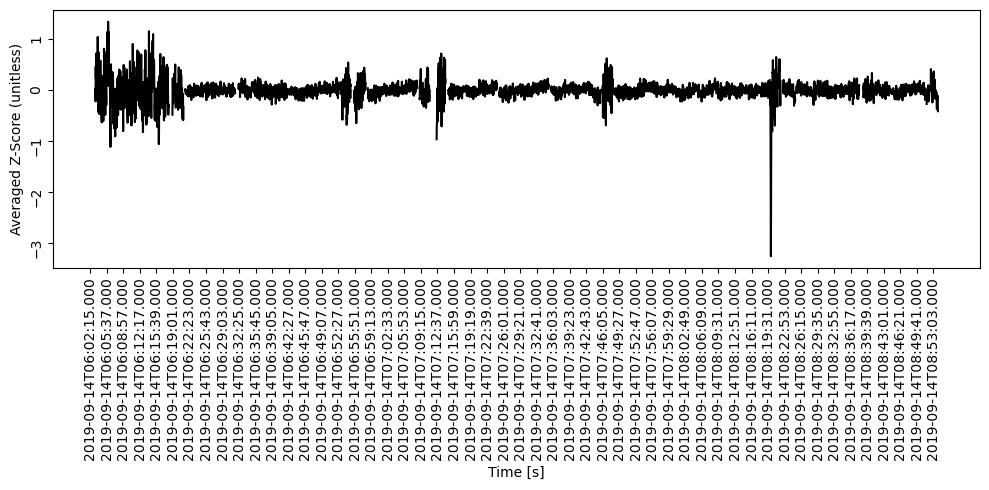

In [70]:
%matplotlib inline
fig, ax = plt.subplots(1, 1, figsize=(10, 5), sharex=True)
ax = inspect.plot_time_series(tisot, np.ma.median(z_score, axis=1), ax, plot_masked=True)
ax.set_ylabel("Averaged Z-Score (unitless)")
ax.set_xticks(tisot[::100])
plt.tight_layout()

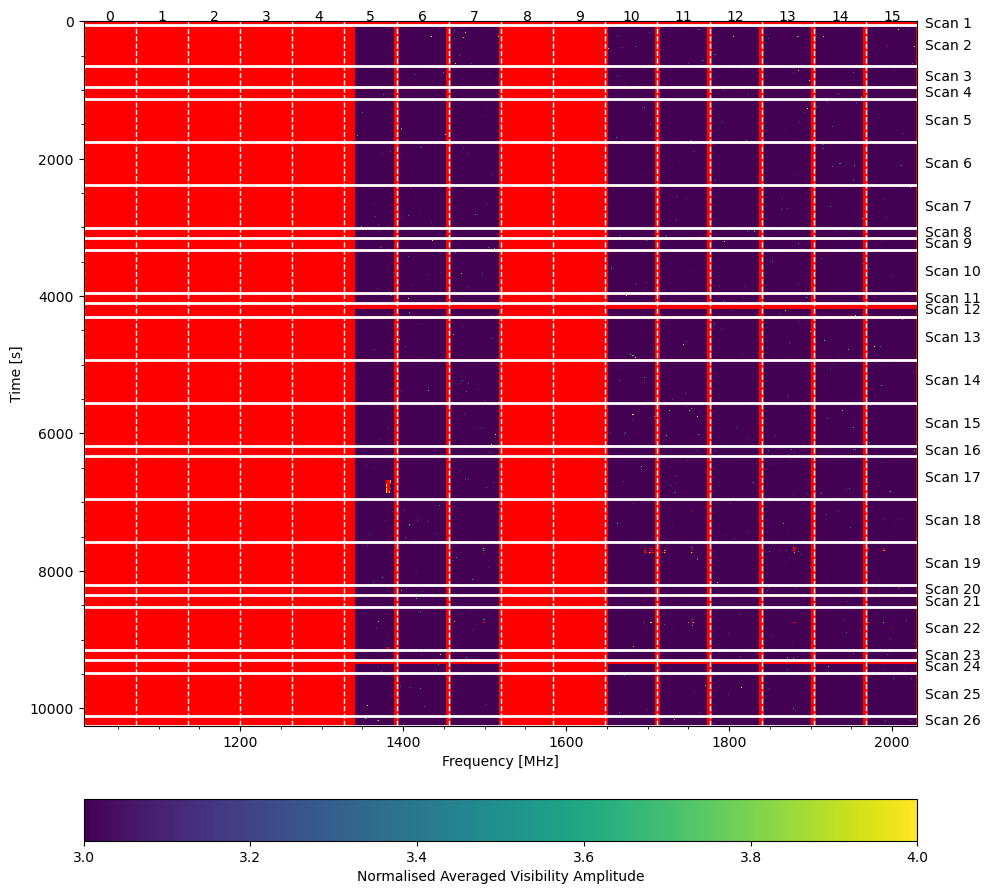

In [71]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(10, 10))
ax, im = inspect.plot_wf(freq_array, z_score, 2, ntimes, vmin=3, vmax=4, cmap=cmap, ax=ax, plot_masked=True)
fig.colorbar(im, orientation="horizontal", pad=0.08, label="Normalised Averaged Visibility Amplitude")